#Preprocessing, EDA and Evaluation


In [ ]:
!pip install transformers
!pip install datasets

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.0/7.0 MB 75.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 200.1/200.1 kB 22.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 91.6 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 468.7/468.7 kB 30.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.5/110.5 kB 14.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.9/132.9 kB 17.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 75.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.2/212.2 kB 25.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.8/158.8 kB 21.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 264.6/264.6 kB 24.5 MB/s eta 0:00:0

In [ ]:
from datasets import load_dataset

#Importing the dataset from hugging face
dataset =  load_dataset('jeremyf/fanfiction_z')

Extracting data files:   0%|          | 0/1 [00:00<?, ?it/s]

Generating train split: 0 examples [00:00, ? examples/s]

Dataset json downloaded and prepared to /root/.cache/huggingface/datasets/jeremyf___json/jeremyf--fanfiction_z-ee1a1447c757b7ff/0.0.0/fe5dd6ea2639a6df622901539cb550cf8797e5a6b2dd7af1cf934bed8e233e6e. Subsequent calls will reuse this data.


  0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
dataset

DatasetDict({
    train: Dataset({
        features: ['story', 'title', 'category'],
        num_rows: 943
    })
})

In [ ]:
import pandas as pd
import re

In [ ]:
#Fetch the store list
story_list = [[i] for i in list(dataset['train']['story'])]
df = pd.DataFrame(story_list,columns=['story'])

In [ ]:
#Extract the titles and the categories of the stories
df['title'] = dataset['train']['title']
df['category'] = dataset['train']['category']

In [ ]:
#Clean up line breaks, extra punctuations etc
df['story_cleaned'] = df['story'].apply(lambda x: x.replace('**',''))
df['story_cleaned'] = df['story_cleaned'].apply(lambda x: x.replace("\n\n", '\n'))
df['story_cleaned'] = df['story_cleaned'].apply(lambda x: re.sub(r'^([a-z])\1*$', 'WORD', x))
# for i in range(df.shape[0]):
#     title = df.iloc[i]['title'].partition('by')[0]
#     df.iloc[i]['story_cleaned'].replace(title,'')
#     print(df.iloc[i]['story_cleaned'])


In [ ]:
df

,story,title,category,story_cleaned
0,just a question\n\nWhat I thought when I first...,just a question by multifics123,Zom-B,just a question\nWhat I thought when I first r...
1,pain\n\nIt may be sad but it can be better\n\n...,pain by Isaiah Thomas,Zenda,pain\nIt may be sad but it can be better\nThe ...
2,"Zombie Mayhem\n\nZombie Mayhem\n\nIn 2050, the...",Zombie Mayhem by kelbey342,Zoombie Blondes,"Zombie Mayhem\nZombie Mayhem\nIn 2050, the mil..."
3,Zero Wing 2: AYBASBTU Game Script\n\nZERO WING...,Zero Wing 2: AYBASBTU Game Script by Rodrigo Shin,Zero Wing,Zero Wing 2: AYBASBTU Game Script\nZERO WING 2...
4,"Not prosaic\n\nDisclaimer, I do not claim to o...",Not prosaic by Fault,Zero Wing,"Not prosaic\nDisclaimer, I do not claim to own..."
...,...,...,...,...
938,More\n\n**I've watched this movie 3 times this...,More by Lizwontcry,Zack and Miri Make a Porno,More\nI've watched this movie 3 times this wee...
939,"Change Comes From Within\n\n**As usual, I own ...",Change Comes From Within by Dominican Girl,Zack and Miri Make a Porno,"Change Comes From Within\nAs usual, I own noth..."
940,Changes\n\nYou know that feeling where people ...,Changes by michieexx3,Zack and Miri Make a Porno,Changes\nYou know that feeling where people be...
941,Undying Hero\n\nZero percent.\n\nVictory canno...,Undying Hero by Arukoir,Z.H.P.,Undying Hero\nZero percent.\nVictory cannot be...


***EDA***



In [ ]:
from matplotlib import pyplot as plt
import matplotlib

In [ ]:
#Find and print different types of categories
df.describe()
df['category'].unique()

array(['Zom-B', 'Zenda', 'Zoombie Blondes', 'Zero Wing', 'Zoom',
       'Zettai Karen Children', 'Zero Day', 'Zombie Prom',
       'Zombie Survival Guide', 'Zeke and Luther', 'Zen', 'Zoop',
       "Zanna, Don't!", 'Zenonia', 'Zetman', 'Z Nation', 'Zatch Bell',
       'Zombieland', 'Zone of The Enders', "Zeke's Pad", 'Zoey 101',
       'Zinda/ज़ंदा', 'Zoo Tycoon', 'Zenon', 'Zombie Fallout',
       'Zombies, Run!', 'Z for Zachariah', 'Zapped', 'Zoombinis',
       'Zombie Powder', 'Zorro', 'Zoey 101, iCarly', 'Zoolander', 'Zoids',
       'Zevo-3', 'Zero Dark Thirty', 'Zombie-Loan', 'Zodiac P.I.',
       'Zeta Project', 'Zathura', 'Zack and Miri Make a Porno', 'Z.H.P.'],
      dtype=object)

In [ ]:
#Find out dominant categories
category_count = df['category'].value_counts()
category_count

Zoey 101                      372
Zoids                         150
Zatch Bell                    113
Zorro                          80
Zombieland                     52
Zombie-Loan                    38
Zombie Survival Guide          21
Zeta Project                   13
Zombies, Run!                  12
Zombie Powder                  12
Zoom                            9
Zombie Fallout                  7
Zenon                           6
Zeke and Luther                 5
Zoey 101, iCarly                5
Zone of The Enders              5
Zapped                          4
Zen                             3
Zoo Tycoon                      3
Zombie Prom                     3
Zero Wing                       3
Zack and Miri Make a Porno      3
Z.H.P.                          2
Zetman                          2
Zodiac P.I.                     2
Zoop                            2
Zevo-3                          1
Zoolander                       1
Zathura                         1
Zero Dark Thir

/usr/local/lib/python3.9/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 2332 (\N{DEVANAGARI LETTER JA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.9/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Matplotlib currently does not support Devanagari natively.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.9/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 2364 (\N{DEVANAGARI SIGN NUKTA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.9/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 2306 (\N{DEVANAGARI SIGN ANUSVARA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.9/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 2342 (\N{DEVANAGARI LETTER DA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.9/dist-packages/IPython

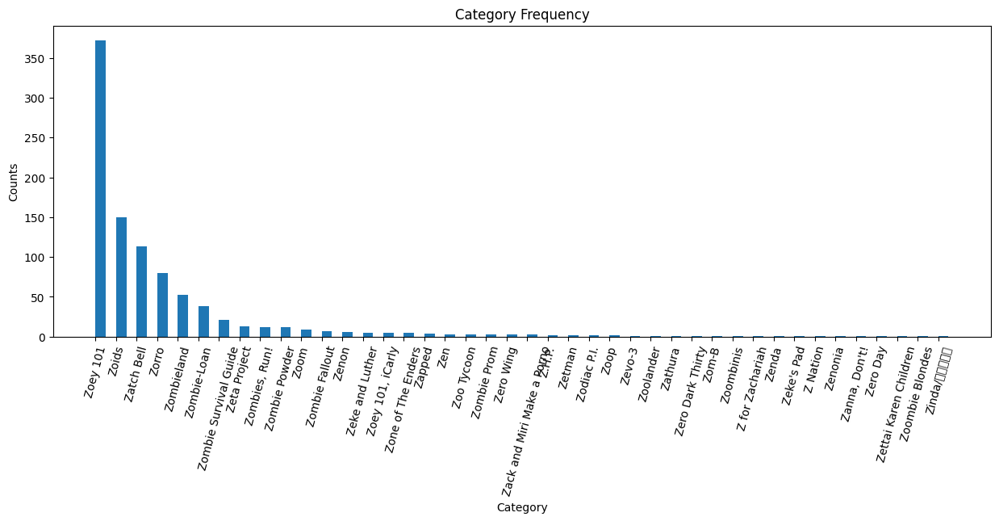

In [ ]:
#Plot counts of stories per category
plt.figure(figsize=(15,5))
plt.xticks(rotation = 75)
plt.bar(category_count.index,category_count,align='edge', width= 0.5)
plt.title('Category Frequency')
plt.xlabel('Category')
plt.ylabel('Counts')
plt.show()

***Expand Contractions***

In [ ]:
import re
contractions_dict = { "ain't": "are not","'s":" is","aren't": "are not",
                     "can't": "cannot","can't've": "cannot have",
                     "'cause": "because","could've": "could have","couldn't": "could not",
                     "couldn't've": "could not have", "didn't": "did not","doesn't": "does not",
                     "don't": "do not","hadn't": "had not","hadn't've": "had not have",
                     "hasn't": "has not","haven't": "have not","he'd": "he would",
                     "he'd've": "he would have","he'll": "he will", "he'll've": "he will have",
                     "how'd": "how did","how'd'y": "how do you","how'll": "how will",
                     "I'd": "I would", "I'd've": "I would have","I'll": "I will",
                     "I'll've": "I will have","I'm": "I am","I've": "I have", "isn't": "is not",
                     "it'd": "it would","it'd've": "it would have","it'll": "it will",
                     "it'll've": "it will have", "let's": "let us","ma'am": "madam",
                     "mayn't": "may not","might've": "might have","mightn't": "might not",
                     "mightn't've": "might not have","must've": "must have","mustn't": "must not",
                     "mustn't've": "must not have", "needn't": "need not",
                     "needn't've": "need not have","o'clock": "of the clock","oughtn't": "ought not",
                     "oughtn't've": "ought not have","shan't": "shall not","sha'n't": "shall not",
                     "shan't've": "shall not have","she'd": "she would","she'd've": "she would have",
                     "she'll": "she will", "she'll've": "she will have","should've": "should have",
                     "shouldn't": "should not", "shouldn't've": "should not have","so've": "so have",
                     "that'd": "that would","that'd've": "that would have", "there'd": "there would",
                     "there'd've": "there would have", "they'd": "they would",
                     "they'd've": "they would have","they'll": "they will",
                     "they'll've": "they will have", "they're": "they are","they've": "they have",
                     "to've": "to have","wasn't": "was not","we'd": "we would",
                     "we'd've": "we would have","we'll": "we will","we'll've": "we will have",
                     "we're": "we are","we've": "we have", "weren't": "were not","what'll": "what will",
                     "what'll've": "what will have","what're": "what are", "what've": "what have",
                     "when've": "when have","where'd": "where did", "where've": "where have",
                     "who'll": "who will","who'll've": "who will have","who've": "who have",
                     "why've": "why have","will've": "will have","won't": "will not",
                     "won't've": "will not have", "would've": "would have","wouldn't": "would not",
                     "wouldn't've": "would not have","y'all": "you all", "y'all'd": "you all would",
                     "y'all'd've": "you all would have","y'all're": "you all are",
                     "y'all've": "you all have", "you'd": "you would","you'd've": "you would have",
                     "you'll": "you will","you'll've": "you will have", "you're": "you are",
                     "you've": "you have"}

# Regular expression for finding contractions
contractions_re=re.compile('(%s)' % '|'.join(contractions_dict.keys()))

# Function for expanding contractions
def expand_contractions(text,contractions_dict=contractions_dict):
  def replace(match):
    return contractions_dict[match.group(0)]
  return contractions_re.sub(replace, text)


In [ ]:

# Expanding Contractions in the reviews
df['story_cleaned']=df['story_cleaned'].apply(lambda x:expand_contractions(x))

***Lower case***

In [ ]:
df['story_cleaned']=df['story_cleaned'].apply(lambda x: x.lower())

In [ ]:
df

,story,title,category,story_cleaned
0,just a question\n\nWhat I thought when I first...,just a question by multifics123,Zom-B,just a question\nwhat i thought when i first r...
1,pain\n\nIt may be sad but it can be better\n\n...,pain by Isaiah Thomas,Zenda,pain\nit may be sad but it can be better\nthe ...
2,"Zombie Mayhem\n\nZombie Mayhem\n\nIn 2050, the...",Zombie Mayhem by kelbey342,Zoombie Blondes,"zombie mayhem\nzombie mayhem\nin 2050, the mil..."
3,Zero Wing 2: AYBASBTU Game Script\n\nZERO WING...,Zero Wing 2: AYBASBTU Game Script by Rodrigo Shin,Zero Wing,zero wing 2: aybasbtu game script\nzero wing 2...
4,"Not prosaic\n\nDisclaimer, I do not claim to o...",Not prosaic by Fault,Zero Wing,"not prosaic\ndisclaimer, i do not claim to own..."
...,...,...,...,...
938,More\n\n**I've watched this movie 3 times this...,More by Lizwontcry,Zack and Miri Make a Porno,more\ni have watched this movie 3 times this w...
939,"Change Comes From Within\n\n**As usual, I own ...",Change Comes From Within by Dominican Girl,Zack and Miri Make a Porno,"change comes from within\nas usual, i own noth..."
940,Changes\n\nYou know that feeling where people ...,Changes by michieexx3,Zack and Miri Make a Porno,changes\nyou know that feeling where people be...
941,Undying Hero\n\nZero percent.\n\nVictory canno...,Undying Hero by Arukoir,Z.H.P.,undying hero\nzero percent.\nvictory cannot be...


***Remove digits and words containing digits***

In [ ]:
df['story_cleaned']=df['story_cleaned'].apply(lambda x: re.sub('\w*\d\w*','', x))

***Remove Punctuations***

In [ ]:
import string
df['story_cleaned']=df['story_cleaned'].apply(lambda x: re.sub('[%s]' % re.escape(string.punctuation), '', x))

In [ ]:
df

,story,title,category,story_cleaned
0,just a question\n\nWhat I thought when I first...,just a question by multifics123,Zom-B,just a question\nwhat i thought when i first r...
1,pain\n\nIt may be sad but it can be better\n\n...,pain by Isaiah Thomas,Zenda,pain\nit may be sad but it can be better\nthe ...
2,"Zombie Mayhem\n\nZombie Mayhem\n\nIn 2050, the...",Zombie Mayhem by kelbey342,Zoombie Blondes,zombie mayhem\nzombie mayhem\nin the military...
3,Zero Wing 2: AYBASBTU Game Script\n\nZERO WING...,Zero Wing 2: AYBASBTU Game Script by Rodrigo Shin,Zero Wing,zero wing aybasbtu game script\nzero wing \...
4,"Not prosaic\n\nDisclaimer, I do not claim to o...",Not prosaic by Fault,Zero Wing,not prosaic\ndisclaimer i do not claim to own ...
...,...,...,...,...
938,More\n\n**I've watched this movie 3 times this...,More by Lizwontcry,Zack and Miri Make a Porno,more\ni have watched this movie times this we...
939,"Change Comes From Within\n\n**As usual, I own ...",Change Comes From Within by Dominican Girl,Zack and Miri Make a Porno,change comes from within\nas usual i own nothi...
940,Changes\n\nYou know that feeling where people ...,Changes by michieexx3,Zack and Miri Make a Porno,changes\nyou know that feeling where people be...
941,Undying Hero\n\nZero percent.\n\nVictory canno...,Undying Hero by Arukoir,Z.H.P.,undying hero\nzero percent\nvictory cannot be ...


***Removing extra spaces***

In [ ]:
df['story_cleaned']=df['story_cleaned'].apply(lambda x: re.sub(' +',' ',x))

In [ ]:
df['story_cleaned']

0      just a question\nwhat i thought when i first r...
1      pain\nit may be sad but it can be better\nthe ...
2      zombie mayhem\nzombie mayhem\nin the military ...
3      zero wing aybasbtu game script\nzero wing \nal...
4      not prosaic\ndisclaimer i do not claim to own ...
                             ...                        
938    more\ni have watched this movie times this wee...
939    change comes from within\nas usual i own nothi...
940    changes\nyou know that feeling where people be...
941    undying hero\nzero percent\nvictory cannot be ...
942    unlosing haunted mansion\ndisclaimer i do not ...
Name: story_cleaned, Length: 943, dtype: object

In [ ]:
import spacy

#Loading the model and then lemmatization
nlp = spacy.load('en_core_web_sm', disable = ['parser','ner'])
df['story_lemmatized'] = df['story_cleaned'].apply(lambda x:' '.join([token.lemma_ for token in list(nlp(x)) if (token.is_stop == False)]))

In [ ]:
df

,story,title,category,story_cleaned,story_lemmatized
0,just a question\n\nWhat I thought when I first...,just a question by multifics123,Zom-B,just a question\nwhat i thought when i first r...,question \n think read b guy think plz leave r...
1,pain\n\nIt may be sad but it can be better\n\n...,pain by Isaiah Thomas,Zenda,pain\nit may be sad but it can be better\nthe ...,pain \n sad well \n yellow sun glisten face \n...
2,"Zombie Mayhem\n\nZombie Mayhem\n\nIn 2050, the...",Zombie Mayhem by kelbey342,Zoombie Blondes,zombie mayhem\nzombie mayhem\nin the military ...,zombie mayhem \n zombie mayhem \n military tes...
3,Zero Wing 2: AYBASBTU Game Script\n\nZERO WING...,Zero Wing 2: AYBASBTU Game Script by Rodrigo Shin,Zero Wing,zero wing aybasbtu game script\nzero wing \nal...,zero wing aybasbtu game script \n zero wing \n...
4,"Not prosaic\n\nDisclaimer, I do not claim to o...",Not prosaic by Fault,Zero Wing,not prosaic\ndisclaimer i do not claim to own ...,prosaic \n disclaimer claim zero wing make mon...
...,...,...,...,...,...
938,More\n\n**I've watched this movie 3 times this...,More by Lizwontcry,Zack and Miri Make a Porno,more\ni have watched this movie times this wee...,\n watch movie time week love urge write littl...
939,"Change Comes From Within\n\n**As usual, I own ...",Change Comes From Within by Dominican Girl,Zack and Miri Make a Porno,change comes from within\nas usual i own nothi...,change come \n usual character belong \n \n ex...
940,Changes\n\nYou know that feeling where people ...,Changes by michieexx3,Zack and Miri Make a Porno,changes\nyou know that feeling where people be...,change \n know feel people believe impacting e...
941,Undying Hero\n\nZero percent.\n\nVictory canno...,Undying Hero by Arukoir,Z.H.P.,undying hero\nzero percent\nvictory cannot be ...,undying hero \n zero percent \n victory gain \...


In [ ]:
#Grouping data according to the category
df_grouped = df[['category','story_lemmatized']].groupby(by='category').agg(lambda x:' '.join(x))
df_grouped

,story_lemmatized
category,
Z Nation,violent delight \n violent delight \n desire c...
Z for Zachariah,get save \n hey guy hope like god bless check ...
Z.H.P.,undying hero \n zero percent \n victory gain \...
Zack and Miri Make a Porno,\n watch movie time week love urge write littl...
"Zanna, Don't!",story \n p styletextalign startnot story try b...
Zapped,trust \n hello people \n see barely fan fic th...
Zatch Bell,healing tear \n sherryyou fight hardplease for...
Zathura,dominique jakowec \n test type \n\n end file \n
Zeke and Luther,wanna skateboard \n helllo know upload new cha...


In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

#Create a Document term matrix for plotting word clouds
cv=CountVectorizer(analyzer='word')
data=cv.fit_transform(df_grouped['story_lemmatized'])
df_dtm = pd.DataFrame(data.toarray(), columns=cv.get_feature_names_out())
df_dtm.index=df_grouped.index
df_dtm.head(10)

,aa,aaa,aaaaaaaaaaaaa,aaaaaaaaaaaaaaaaaaaaaaaa,aaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaahhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhh,aaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaahhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhh,aaaaaaaaaaaaaaaaaaaaaahhhhhhhhhhhh,aaaaaaaaaaaaanyway,aaaaaaaaahhh,aaaaaaaahhhhhhh,...,zzz,zzzaker,zzzoa,zzzoid,zzzzzzzzzzz,zzzzzzzzzzzzzz,zzzzzzzzzzzzzzz,zzzzzzzzzzzzzzzzz,zzzzzzzzzzzzzzzzzzz,zzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzz
category,,,,,,,,,,,,,,,,,,,,,
Z Nation,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Z for Zachariah,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Z.H.P.,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Zack and Miri Make a Porno,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Zanna, Don't!",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Zapped,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Zatch Bell,1,0,0,0,1,1,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
Zathura,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Zeke and Luther,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


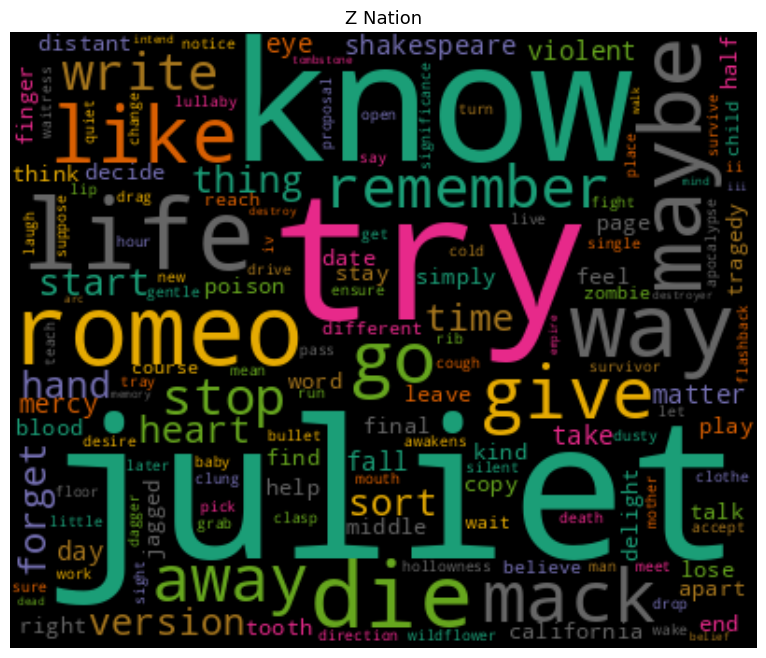

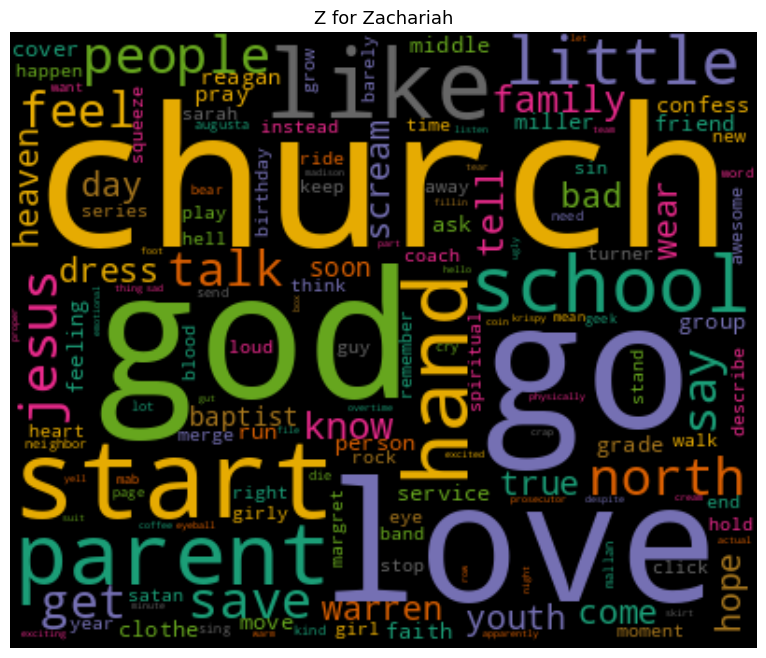

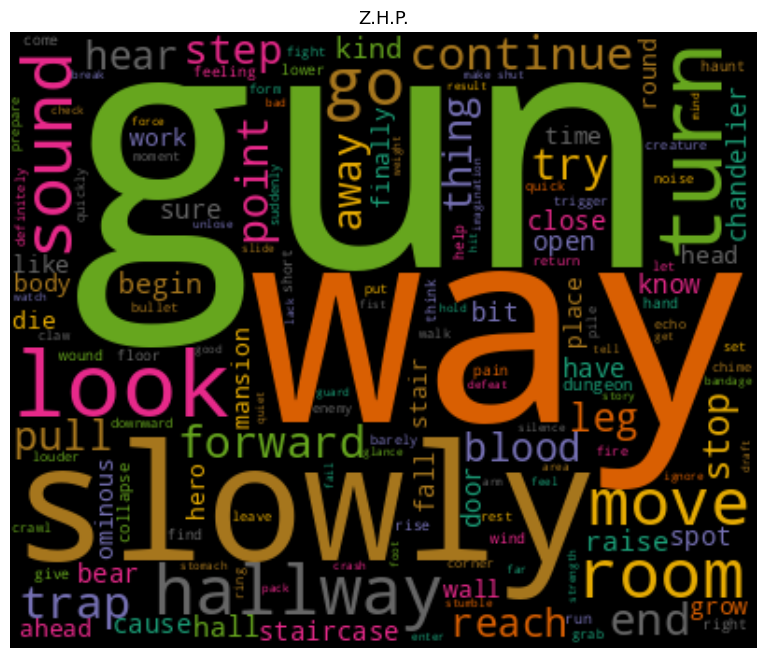

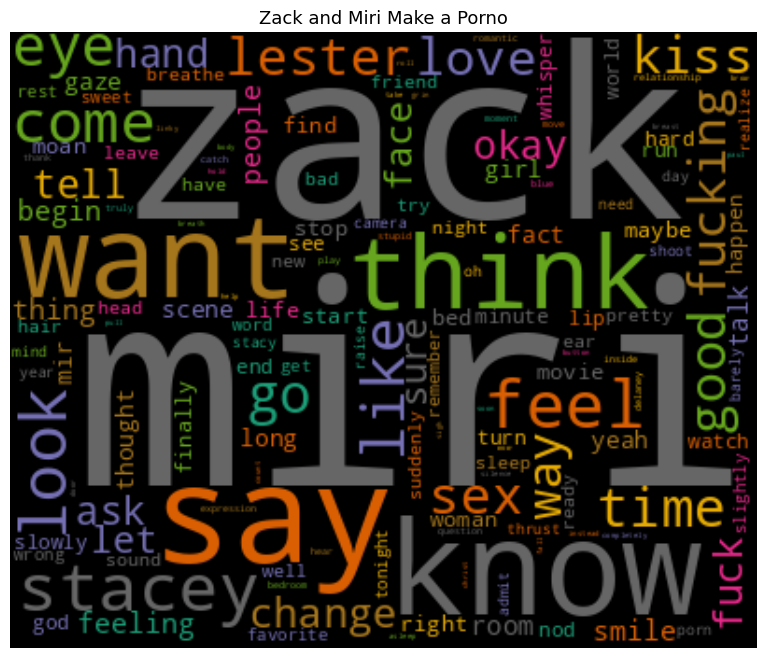

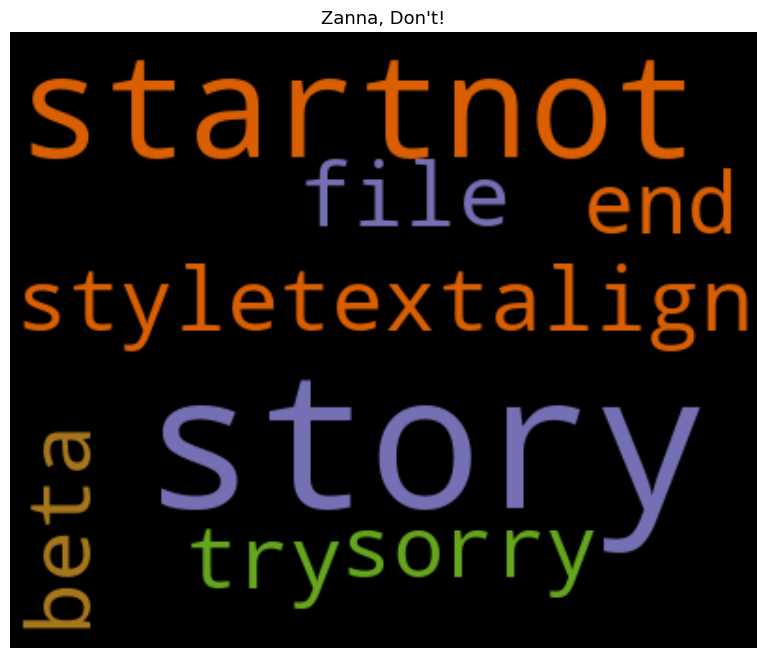

...

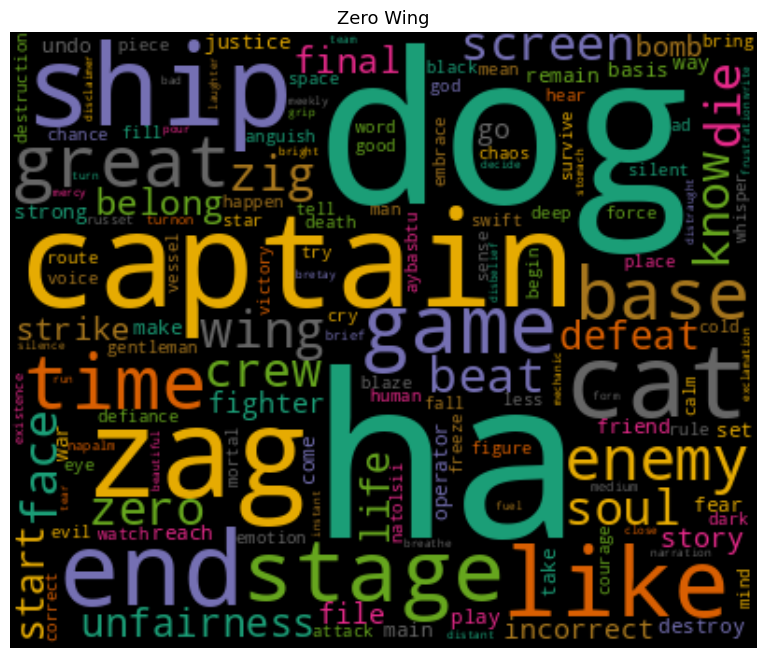

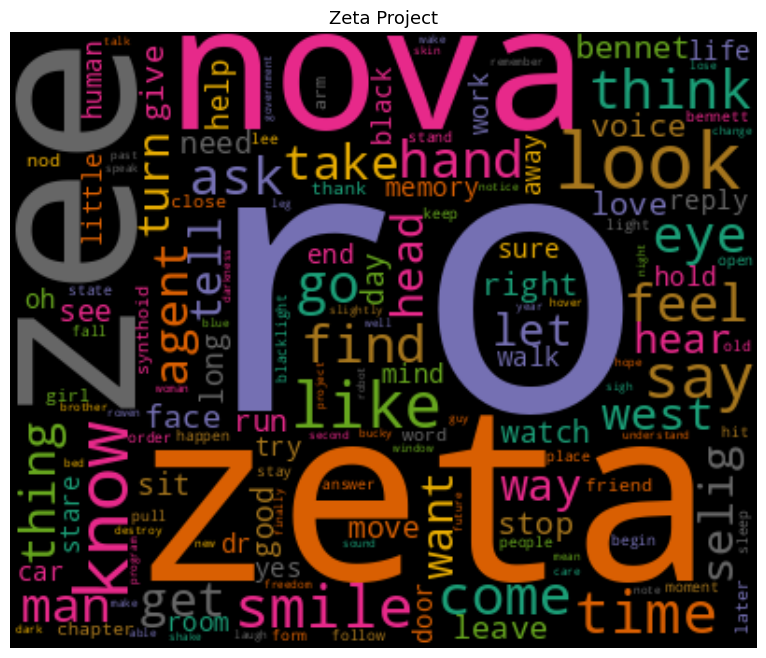

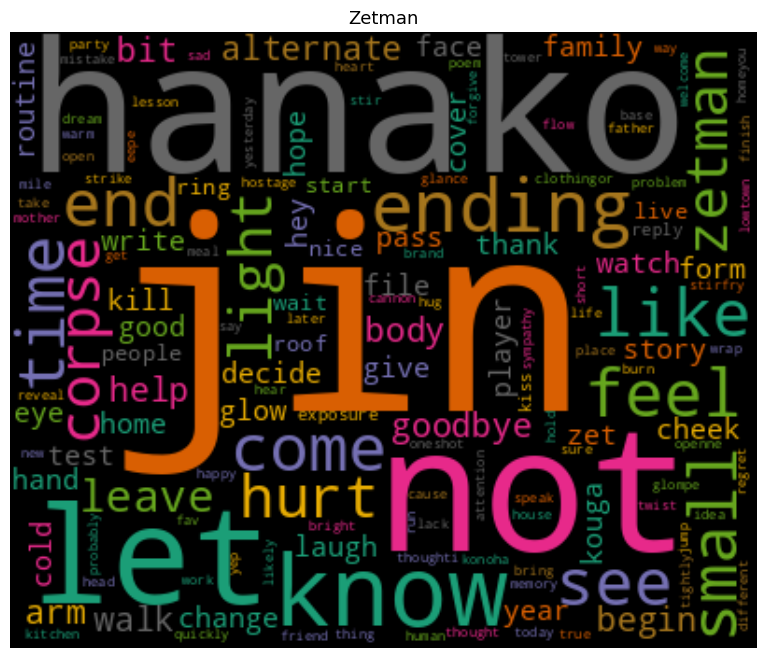

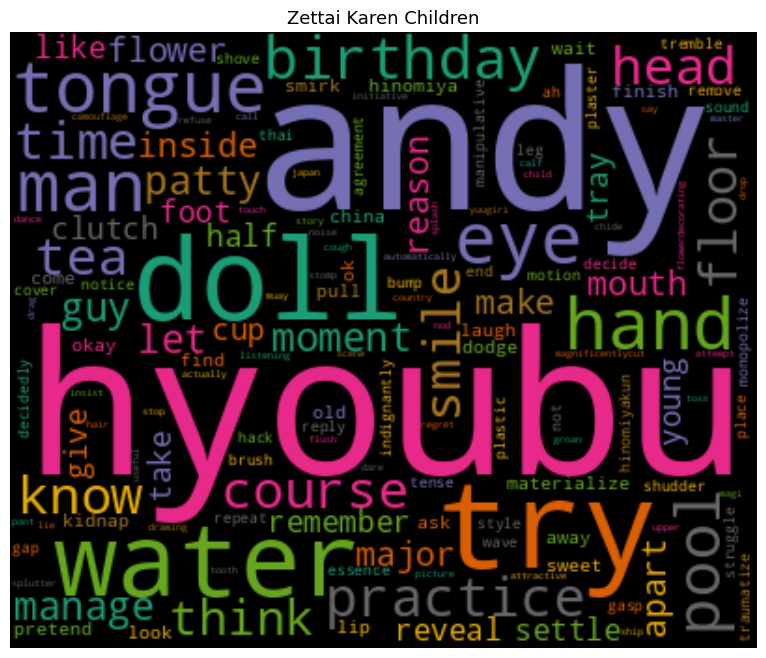

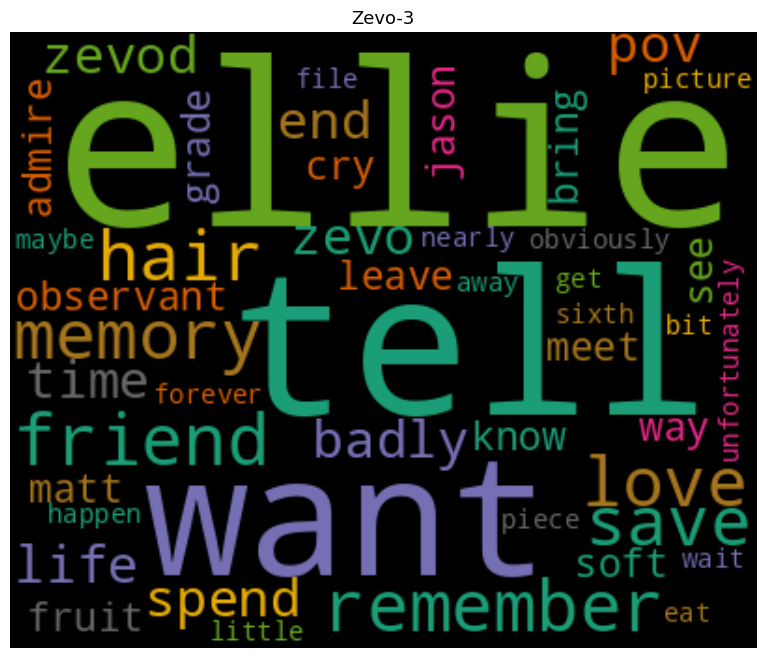

/usr/local/lib/python3.9/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 2332 (\N{DEVANAGARI LETTER JA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.9/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Matplotlib currently does not support Devanagari natively.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.9/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 2364 (\N{DEVANAGARI SIGN NUKTA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.9/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 2306 (\N{DEVANAGARI SIGN ANUSVARA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.9/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 2342 (\N{DEVANAGARI LETTER DA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.9/dist-packages/IPython

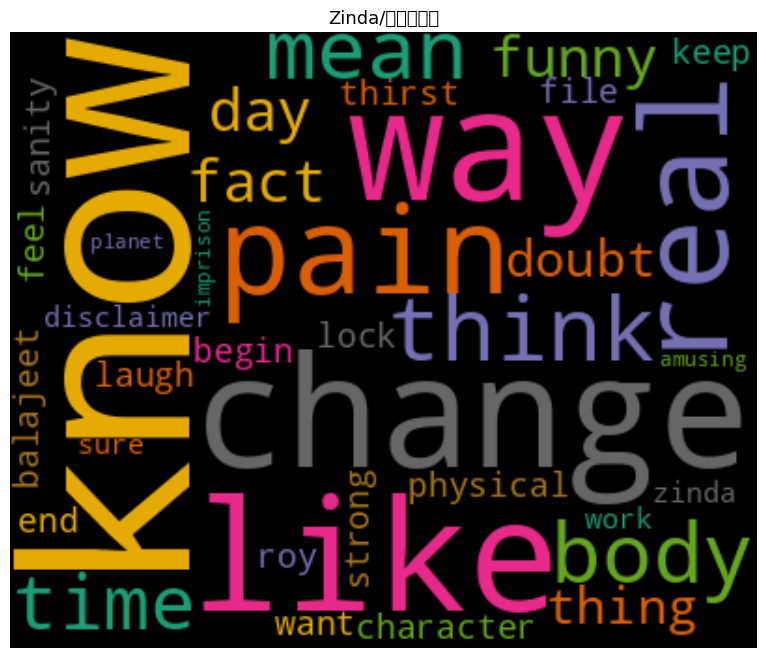

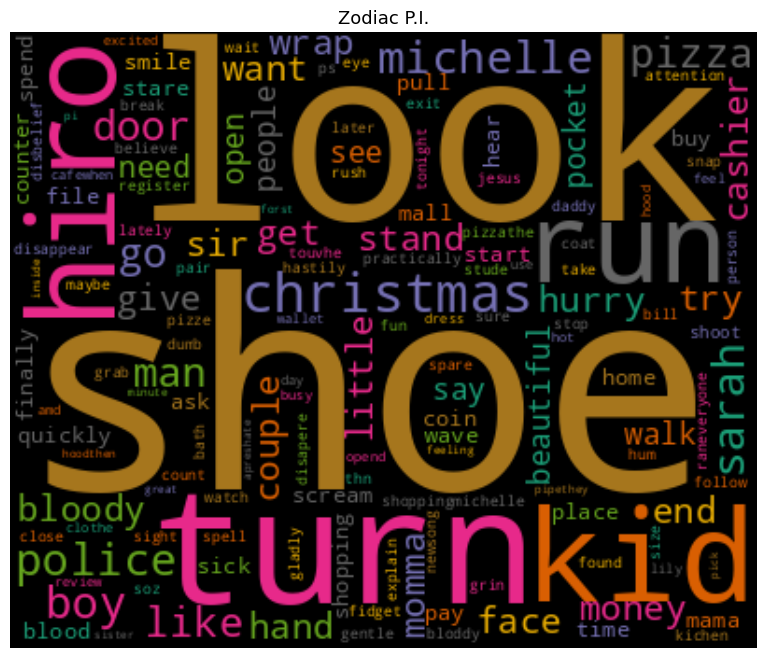

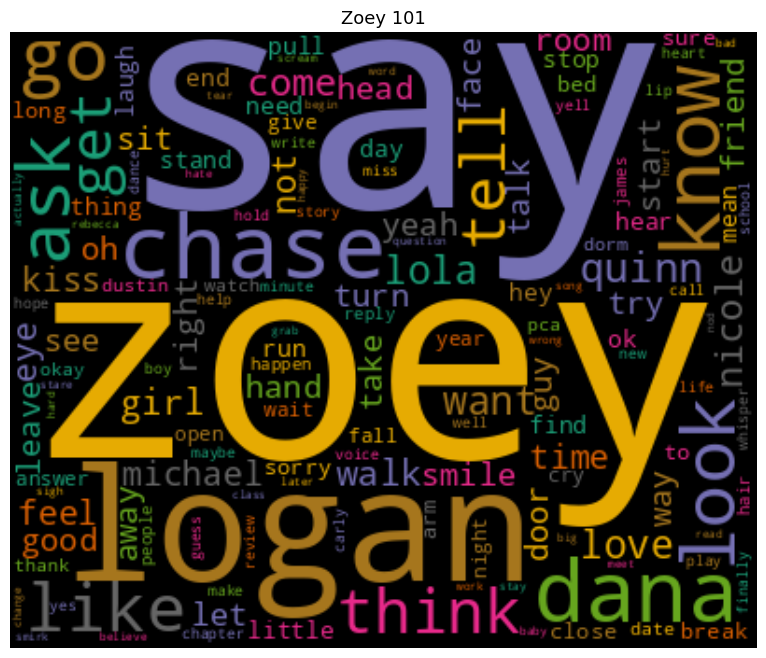

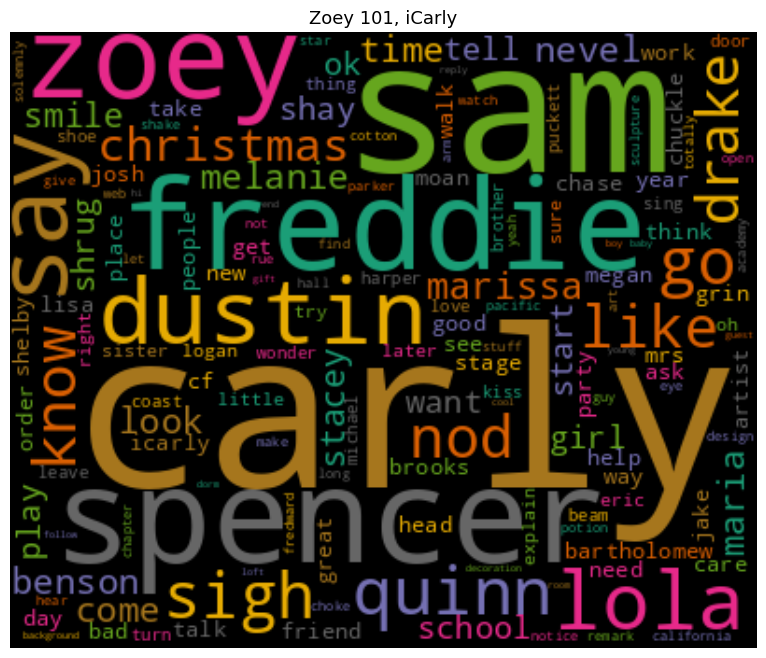

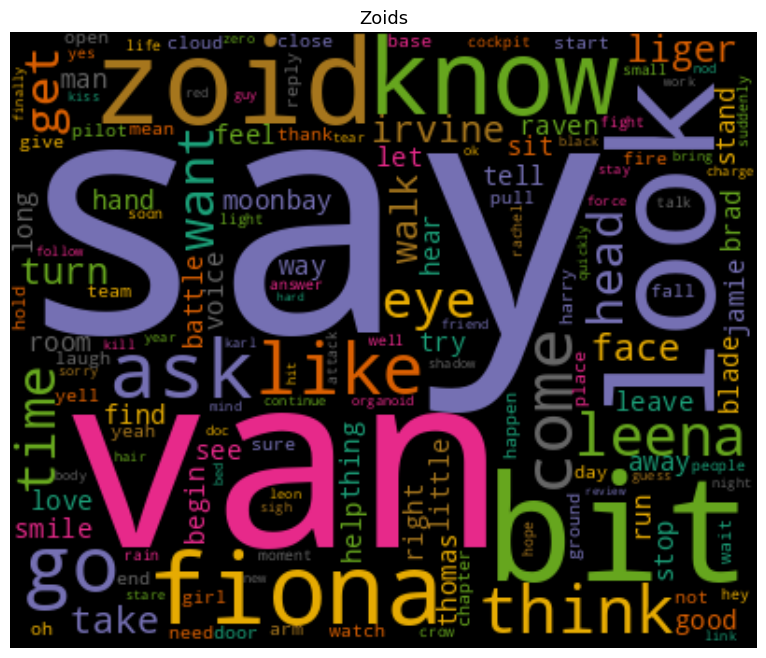

...

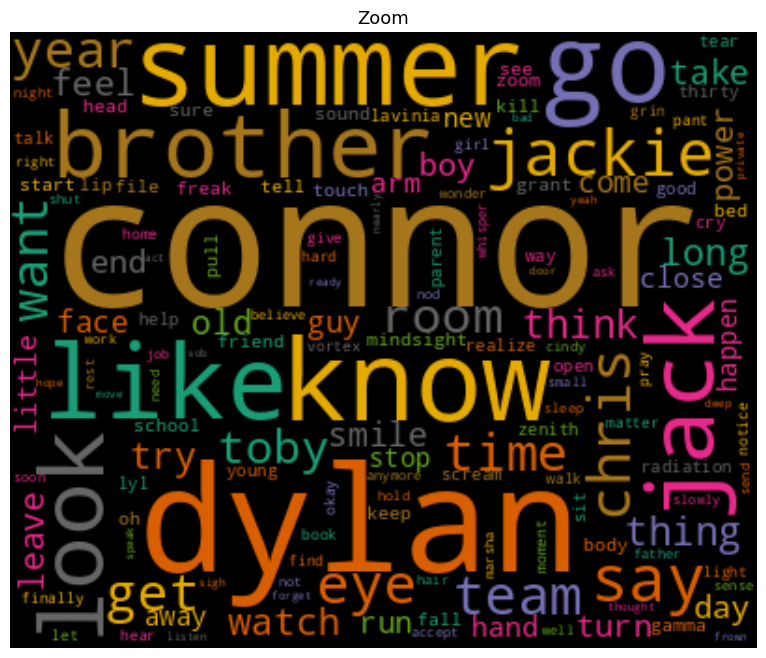

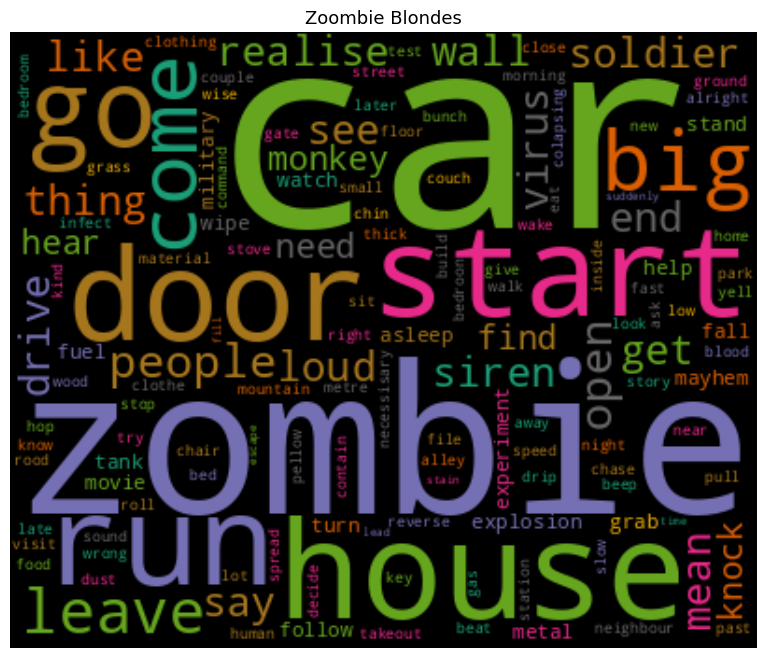

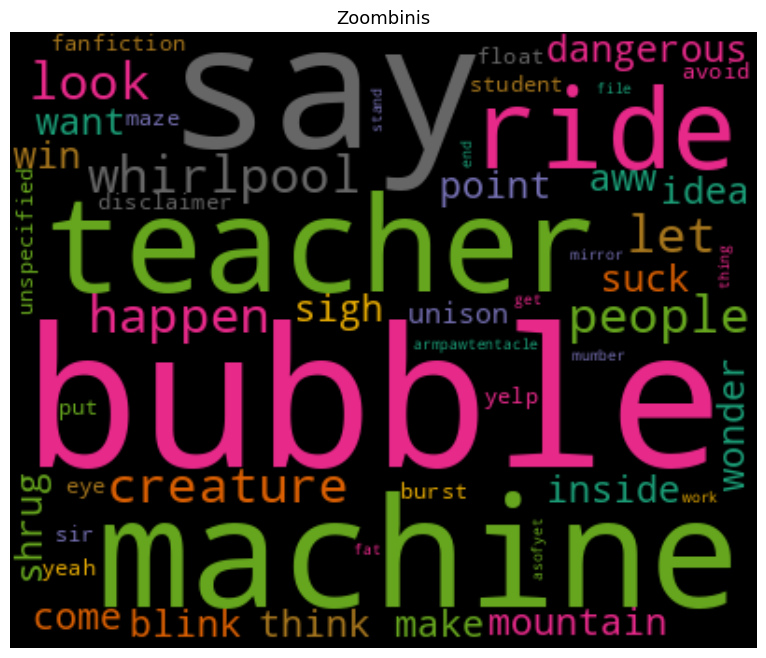

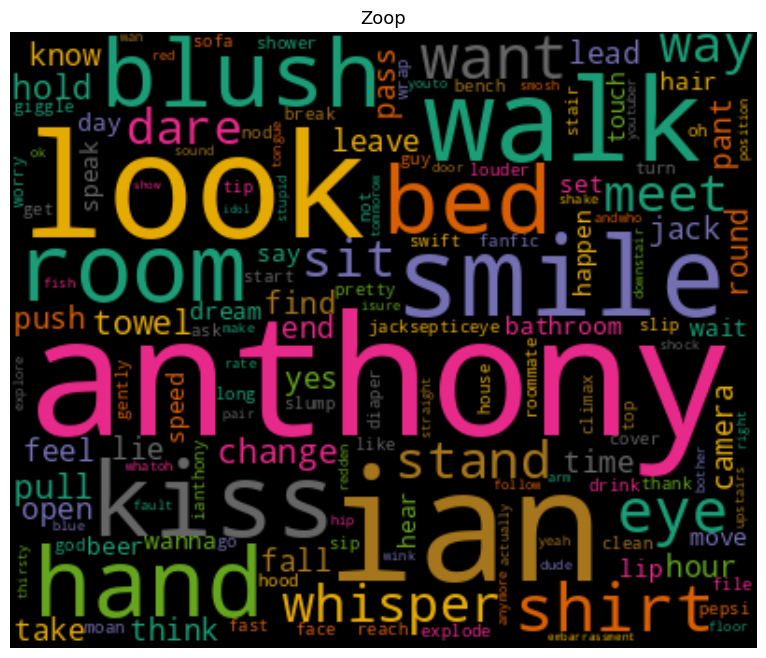

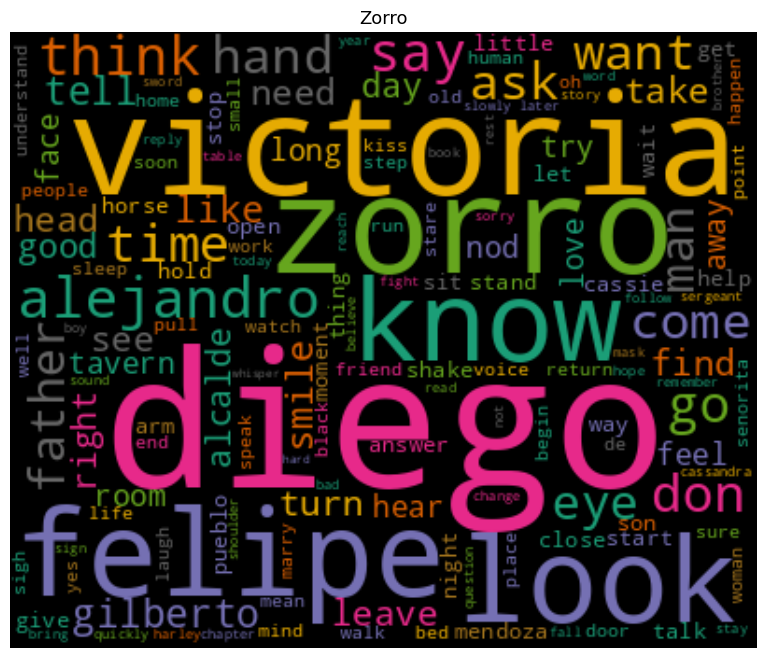

In [ ]:
# Importing wordcloud for plotting word clouds and textwrap for wrapping longer text
from wordcloud import WordCloud
from textwrap import wrap

# Main method for generating word clouds (freq of different words in a doc)
def generate_wordcloud(data,title):
  wc = WordCloud(width=400, height=330, max_words=150,colormap="Dark2").generate_from_frequencies(data)
  plt.figure(figsize=(10,8))
  plt.imshow(wc, interpolation='bilinear')
  plt.axis("off")
  plt.title('\n'.join(wrap(title,60)),fontsize=13)
  plt.show()

# Transposing document term matrix
df_dtm=df_dtm.transpose()
# Plotting word cloud for each product
for index,product in enumerate(df_dtm.columns):
  generate_wordcloud(df_dtm[product].sort_values(ascending=False),product)

In [ ]:
#Saving the vectorized data to a csv
dtm_file_path = 'dtm_data.csv'
cleaned_data_path = 'cleaned_data.csv'

# Save DataFrame to CSV
df_dtm.to_csv(dtm_file_path, index=False)
df.to_csv(cleaned_data_path, index=False)